In [1]:
from IPython.core.display import HTML
# https://stackoverflow.com/questions/32156248/how-do-i-set-custom-css-for-my-ipython-ihaskell-jupyter-notebook
styles = open('./custom_css.css', "r").read()
s = '<style>%s</style>' % styles     
HTML(s)

# Table of Contents

1. [Table of Contents](#Table-of-Contents)
1. [Task explanation](#Task-explanation)
	1. [Task 1: Social Media Analysis -- Key Problems by City/Neighborhood in Sweden](#Task-1:-Social-Media-Analysis----Key-Problems-by-City/Neighborhood-in-Sweden)
	1. [Task 2: Search Analysis -- Violence Against Women](#Task-2:-Search-Analysis----Violence-Against-Women)
1. [Raw data example](#Raw-data-example)
1. [Data load & Pre-processing](#Data-load-&-Pre-processing)
1. [Initial Descriptive Analysis](#Initial-Descriptive-Analysis)
	1. [Locations](#Locations)
		1. [Locations. Cities](#Locations.-Cities)
		1. [Locations. Cities & Neighborhoods](#Locations.-Cities-&-Neighborhoods)
	1. [Texts](#Texts)
	1. [Dictionary](#Dictionary)
	1. [What we found in datasets?](#What-we-found-in-datasets?)
1. [Task 1](#Task-1)
    1. [Introduction](#Part-1-Introduction)
    1. [Data Example](#Part-1-Data-Example)
	1. [Solution code](#Part-1-Solution-code)
        1. [How to improve the classification model?](#How-to-improve-the-classification-model?)
	1. [Categories of Problems - general look](#Categories-of-Problems---general-look)
		1. [Tweets with zero, one, or many categories](#Tweets-with-zero,-one,-or-many-categories)
		1. [Categorized tweets with one or many keywords](#Categorized-tweets-with-one-or-many-keywords)
	1. [Categories of Problems at City-level](#Categories-of-Problems-at-City-level)
		1. [Shares of Problems by City](#Shares-of-Problems-by-City)
		1. [Shares of Problems and Geographies of Cities - joint look](#Shares-of-Problems-and-Geographies-of-Cities---joint-look)
		1. [Shares of Problems and Geographies of Cities - separated look](#Shares-of-Problems-and-Geographies-of-Cities---separated-look)
	1. [Texts and Categories of problems](#Texts-and-Categories-of-problems)
	1. [Sub-category & Neighborhoods view](#Sub-category-&-Neighborhoods-view)
1. [Task 2](#Task-2)
	1. [Introduction](#Part-2-Introduction)
	1. [Data Example](#Part-2-Data-Example)
	1. [Explanatory](#Explanatory)
		1. [Search KWs - overview](#Search-KWs---overview)
		1. [Search KWs - missing values](#Search-KWs---missing-values)
	1. [Solution code](#Part-2-Solution-code)
		1. [YOY](#YOY)
		1. [YTD](#YTD)
	1. [YOY view - by Type of violence](#YOY-view---by-Type-of-violence)
	1. [YOY growth - by Type of violence](#YOY-growth---by-Type-of-violence)
	1. [YTD view - by Type of violence & Discourse theme](#YTD-view---by-Type-of-violence-&-Discourse-theme)
	1. [How to improve the charts above?](#How-to-improve-the-charts-above?)

[To table of contents](#Table-of-Contents)

***

# Task explanation
* We have **two tasks** described below. 
* We need 
    1. **to analyze** location-wise trends using small texts (tweets) dataset
    2. **to visualize** nested time series (search trends by nested categories) dataset.
    * Additionally, we need to answer specific questions

### Task 1: Social Media Analysis -- Key Problems by City/Neighborhood in Sweden
On the `"Social data"` tab, you will find a worksheet that reflects how one of our typical Twitter data pulls look like.
For this task, please just focus on the columns:
- input keyword to extract tweets
- location of tweets
- actual tweets

Task:
Find the main problems that are being talked about on Twitter, on a city level and on a neighbourhood level.
- On a city level, what are the main categories of problems being expressed by residents living in the area? (size by %)
- On a neighbourhood level, what are the sub-categories of problems being expressed by residents? (size by %)
- Find a way to visualise this is a clear and compelling way.

On the `"Dictionary"` tab, we have shortlisted some problems, classified into main categories and sub-categories, each of them with keyword proxies. Use index match to find the count of posts that talk about the respective problems.

### Task 2: Search Analysis -- Violence Against Women
On the `"Search data"` tab, you will see the results of a typical Google search data pull.

Task:
Create a clear visualisation that shows the different types of violence that are being searched about in the past year, and what the main discourse is around each type of violence.
- Which ones have the highest search volume?
- Which ones have the highest growth in searches?

[To table of contents](#Table-of-Contents)

Sources: nlp - _Kaggle Jigsaw * Comments competitions_, charts - [\[2\]](https://www.kaggle.com/code/kishalmandal/most-detailed-eda-tf-idf-and-logistic-reg) [[3]](https://www.kaggle.com/code/jagangupta/stop-the-s-toxic-comments-eda)

***

# Raw data example
> * 1.1. social_data (Twitter data pulls)

```
On the "Social data" tab, you will find a worksheet that reflects how one of our typical Twitter data pulls look like. 
```

|  | keyword 	| neighborhood 	| city 	| category 	| created_at 	| post_id 	| text 	| lang 	| translated_text|
|---	|---	|---	|---	|---	|---	|---	|---	|---	|---	|
| 908 	| Araby Cikány -has:links 	| Araby 	| Växjö 	| NaN 	| Fri Aug 17 08:55:41 +0000 2018 	| 1.030378e+18 	| @ChytraJako to je doufám řečnická otázka 😁 Nikdo nemůže dobrovolně chtít DVĚ tchyně na jednom místě 😶😁\nprosimtě co na nich konkrétně miluješ? Feťáky a bezdomovce po pas zabořený v popelnicích, araby nebo cikány? 😀 	| cs 	| @ChytraHow is this a hopeful rhetorical question 😁 No one can voluntarily want TWO mother-in-law in one place 😶😁 please what do you specifically love about them? Junkies and homeless passports buried in bins, Arabs or gypsies? 😀	|

```
For this task, please just focus on the columns: input keyword to extract tweets, location of tweets, actual tweets
```

> * 1.2. dictionary (keyword for tweets)

```
On the "Dictionary" tab, we have shortlisted some problems, classified into main categories and sub-categories, each of them with keyword proxies.
```

|CATEGORY 	| SUB CATEGORY 	| KEYWORD  	|
|-------	|-------------	|----------------	|
|Crime      |problem area   | Vulnerable area   |
|Neglect    |poverty        | impoverished      |
|Xenophobia |Islamophobia   | kebab seller      |
|Crime      |gun violence   | loud bangs        |
|Parking    |parking        | dense             |
|Crime      |rape           | sexual assault    |

> * 2.1. search_data (Google search data pull)

```
On the "Search data" tab, you will see the results of a typical Google search data pull.
```

|id | Search KWs 	    | Type of violence 	| Discourse theme 	| Search Volume m/yyyy 	|
|---|------------------	|------------------	|------------------	|---------------------	|
|...| abuses of internet 	| Psychological | Online harassment 	| 1600.0 	|
|98 | spouse abuse  	    | Physical  	| marital violence  	| 4400.0  	|
|...| how to expose wife 	| Psychological| Doxxing| 0.0 	|
|...| harassment at work 	| Psychological 	| Workplace harassment	| 6600.0  	|
|...| loss of masculinity 	| Physical| Violence due to social rejection 	| 0.0 	|
|...| face acid | Physical 	| Acid violence 	| 8100.0 	|
|115| wife made to have sex 	| Sexual 	| marital rape 	| NaN  	 |
|55 | revenge porn 	| Psychological 	| Violence due to social rejection 	| 246000.0 	|
|100| domestic violence against women  	|Physical 	| marital violence 	| 2400.0 	|


[To table of contents](#Table-of-Contents)

***

# Data load & Pre-processing

Let's **import the modules** we need to process the data easily
* Public packages to handle computations over tabular and text data
* Custom scripts with pre-built visualizations and analytical code


In [2]:
import sys; sys.path.insert(0, '..')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

import missingno
import folium
import cartopy
from wordcloud import WordCloud
from nltk import TweetTokenizer

import warnings; warnings.filterwarnings('ignore')

import src.analytical_processing as analytical_processing
import src.visualisations as visuals_prepared
import importlib; importlib.reload(analytical_processing); importlib.reload(visuals_prepared);

Let's **load (<u>read)</u> the data** we have
* Read main datasets, provided as-is
* Read auxiliary datasets, gathered additionally (i.e. <u>geo-coordinates</u>, shape-files, geo-, social-, demographic- datasets)

In [3]:
# main datasets
social_data = pd.read_excel('../data/raw/Data Analysis and Visualization Assignment.xlsx',
                            sheet_name='Social data')
dictionary = pd.read_excel('../data/raw/Data Analysis and Visualization Assignment.xlsx', 
                           sheet_name='Dictionary ')
search_data = pd.read_excel('../data/raw/Data Analysis and Visualization Assignment.xlsx', 
                            sheet_name='Search data')
# auxilary datasets
cities_geo_coords = pd.read_csv('../data/external/geocoded_by_geoapify-7_6_2022, 10_26_18 PM.csv')

In [4]:
social_data.head(2)

,keyword,neighborhood,city,category,created_at,post_id,text,lang,translated_text
0,Östermalm (flyktingar OR asylsökande) -has:links,Östermalm,Kristianstad,NaN,Fri Jul 03 07:55:56 +0000 2020,1.278961e+18,@gustavkassel @AfS_riks @EmmaFeldman23 @svtnyh...,sv,@gustavkassel @AfS_riks @ EmmaFeldman23 @svtny...
1,Östermalm utanförskapsområden -has:links,Östermalm,Kristianstad,NaN,Wed Jun 06 09:49:56 +0000 2018,1.004299e+18,@federley Det system vi har idag gör det möjli...,sv,@federley The system we have today makes it po...


In [5]:
dictionary.head(2)

,CATEGORY,SUB CATEGORY,KEYWORD
0,Crime,problem area,Vulnerable area
1,Crime,problem area,No go zone


In [6]:
search_data.head(2)

,Search KWs,Type of violence,Discourse theme,Search Volume 5/2020,Search Volume 6/2020,Search Volume 7/2020,Search Volume 8/2020,Search Volume 9/2020,Search Volume 10/2020,Search Volume 11/2020,...,Search Volume 7/2021,Search Volume 8/2021,Search Volume 9/2021,Search Volume 10/2021,Search Volume 11/2021,Search Volume 12/2021,Search Volume 1/2022,Search Volume 2/2022,Search Volume 3/2022,Search Volume 4/2022
0,abuses of internet,Psychological,Online harassment,1600.0,1600.0,1600.0,1600.0,1600.0,1900.0,2400.0,...,1900.0,2400.0,1600.0,1600.0,1900.0,1300.0,1900.0,2400.0,2400.0,1900.0
1,online abuse,Psychological,Online harassment,1000.0,880.0,1000.0,880.0,1000.0,1300.0,1300.0,...,2900.0,2400.0,1300.0,1900.0,1600.0,1300.0,1300.0,1600.0,1300.0,1300.0


Let's **pre-process datasets** we have
* Handle _encodings disparities_ that have occured while translations (i.e. because of different alphabets and system set-ups)
* _Drop rows with NANs_ in both translated or original texts
* _Handle tweets where the user tag and user name are separated_ by space in both original and translated texts
* Drop translated texts where the language is not English* (_delayed_)

In [7]:
%time
social_data['translated_text'] = social_data.translated_text.str.replace('&#39;', "\'")

# change only that `@ ` where exist is in translated and not exist in original text
mask = social_data.text.str.contains('@ ', na=False) & social_data.translated_text.str.contains('@ ', na=False)
social_data['translated_text'] = social_data.translated_text.where(cond=mask, # self = mask=True
                                                                   other=lambda x : x.str.replace('@ ', "@")
                                                                  )

# NANs original and in translated texts
social_data = social_data[~social_data.text.isna()]
social_data = social_data[~social_data.translated_text.isna()]

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 3.1 µs


[To table of contents](#Table-of-Contents)

***

# Initial Descriptive Analysis

$\star$ Data is about Sweden (`Sverige`). Here are two maps to imagine what and where Sweden is. Originally, many of a text data were in the Swedish language

| Map of Sweden 	|  	    |
|------------------ |------ |
| <img src="../figures/external/political-map-of-sweden.jpg" width=355 height=200 /> | <img src="../figures/external/counties-of-sweden-map.webp" width=340 height=200 /> |

### Locations
We've got $13$ cities with a respective number (#) of neighborhoods listed below. Worth to mention that a definition of "`neighborhood`" is pretty broad here.

> | City         	| neighborhoods                                                                                             	| #,  	|
|--------------	|-----------------------------------------------------------------------------------------------------------	|-----	|
| Borås        	| Hässleholmen, Sjöbo                                                                                       	| 2   	|
| Eskilstuna   	| Öster, Fröslunda, Stenby, Råbergstorp, Myrtorp, Norr Eskilstuna, Övre Nyfors, Snopptorp, Söder Eskilstuna 	| 9   	|
| Göteborg     	| Bergsjön, Angered, Gårdsten, Kållered, Lindome                                                            	| 5   	|
| Haninge      	| Brandbergen                                                                                               	| 1   	|
| Karlskrona   	| Cottage, Rödeby, Björkhaga, Jämjö, Trossö, Galgamarken, Pantarholmen                                      	| 7   	|
| Kristianstad 	| Östermalm, Centrum, Udden, Parkstaden, Öllsjö                                                             	| 5   	|
| Linköping    	| Skäggetorp, Ryd                                                                                           	| 2   	|
| Malmö        	| Rosengård, Innerstaden, Hermodsdal, Lindängen, Heleneholm                                                 	| 5   	|
| Markaryd     	| Markaryd, Strömsnäsbruk, Timsfors                                                                         	| 3   	|
| Nyköping     	| Brandkärr, Fågelbo                                                                                        	| 2   	|
| Tensta       	| Tensta                                                                                                    	| 1   	|
| Växjö        	| Biskopsgården, Araby                                                                                      	| 2   	|
| Örebro       	| Brickebacken, Varberga                                                                                    	| 2   	|

#### Locations. Cities

Let's **plot an overall distribution** of un-categorized (raw) tweeted texts by every city we have.
* We see the data is imbalanced
* Moreover, an imbalance is likely rooted in our specific data gathering desire than in known factors (i.e. city size, population, or economic impact)

In [8]:
left_aux = social_data.groupby('city', as_index=False).translated_text.count()
right_aux = cities_geo_coords[['original_City', 'lat', 'lon']]
city_count_aux = pd.merge(left_aux, right_aux, left_on='city', right_on='original_City')
del left_aux, right_aux #, cities_geo_coords

map_object = visuals_prepared.plot_folium_map_with_circles(df_to_plot=city_count_aux, save=True)
map_object.save('../figures/Map_all_texts.html')
map_object

_Source:_ [[1]](https://www.martinnorin.se/data-science/python-map-visualizations/)

#### Locations. Cities & Neighborhoods

Then, let's **plot the same distribution** but with an account for a slice of "neighborhoods".
* We see the data is imbalanced at this level of granularity too & also.
* \* We could plot an extra map here too, but the author was too unmotivated to look for Sveden shapefiles and match them with our dataset :)


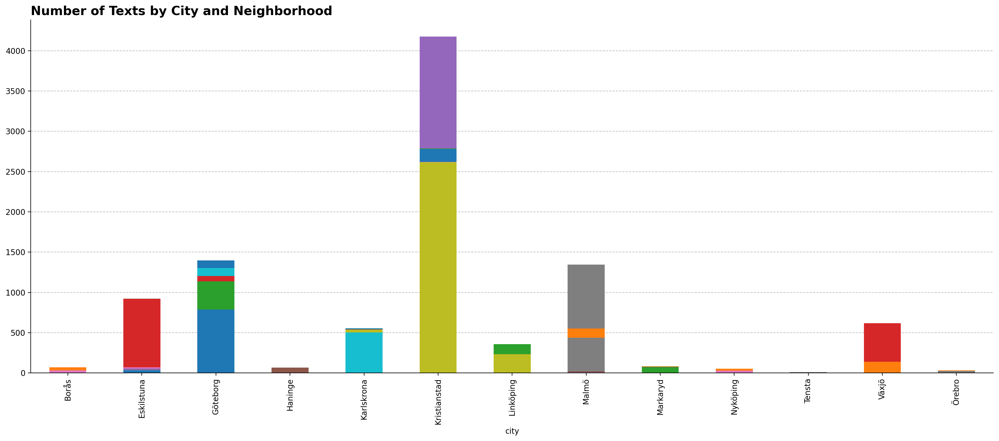

In [9]:
df_to_plot = social_data.groupby(['city', 'neighborhood']).translated_text.count().unstack('neighborhood')

fig, axes = plt.subplots(1, 1, figsize = (12, 8), dpi=200);

df_to_plot.plot.bar(stacked=True, ax=axes, zorder=2)

axes.set_title(label='Number of Texts by City and Neighborhood', 
               loc='Left', fontsize=16, fontweight='bold')
axes.get_legend().remove()
axes.spines[['top', 'right']].set_visible(False) 
axes.grid(which='major', axis='y', linestyle='--', alpha=0.8, zorder=1)
fig.tight_layout(rect=[0, 0.00, 1.5, 1.])

**What did we find regarding locations?**
* Disbalance of "target actions" (number of tweets) between locations
    * Worth to consider, f.e., to cluster (segment) locations into "groups" or buckets when we evaluate the results (e.g. cities with $\leq 500, (500-2000), \geq 2000$ tweets)
    * Worth to consider to join some additional datasets which would explain cities and sub-divisions better (e.g. population, econ, criminal stats)

[To table of contents](#Table-of-Contents)

### Texts
**On one hand**, every location we saw above is described, primary, by the vector tweets and related technical features - keywords, DateTime)
* We could analyze texts themselves (length, punctuation, parts of sentences, stems or lemmas, different tokenizations, counts of emojis, named entities, and different stopwords...) and check their co-distributions with locations
* We could take into account the languages the original texts were written and then try to estimate semantic "loses" and "gains" of translation (i.e. ambiguity in translation)



CPU times: user 17.6 s, sys: 3.32 s, total: 21 s
Wall time: 21 s


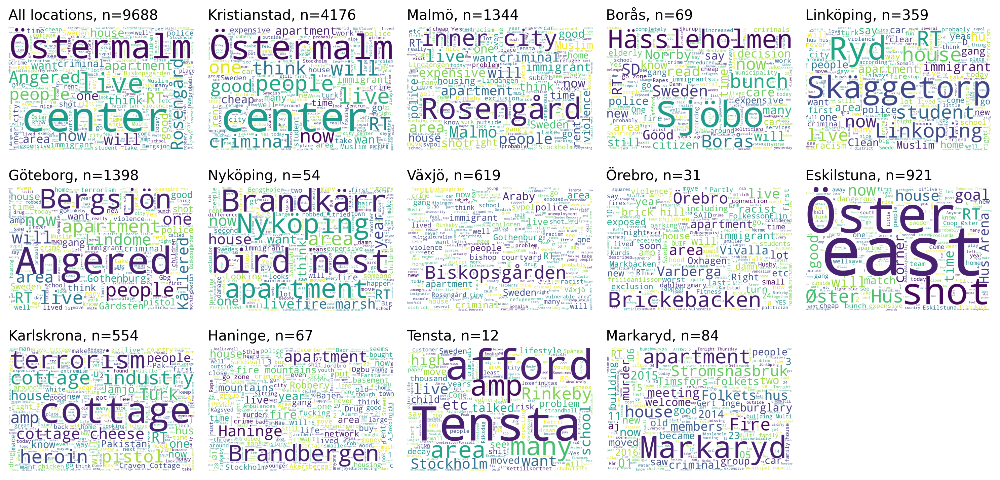

In [10]:
%%time

fig, axes = plt.subplots(3, 5, figsize=(12, 6), dpi=250);
axes = axes.flatten()

visuals_prepared.plot_wordcloud(social_data[~social_data.translated_text.isna()].translated_text, 
               tokenizer=TweetTokenizer(preserve_case=False), axis=axes[0])
axes[0].set_title("All locations" + f", n={social_data.shape[0]}", loc='left')

for indx, city in enumerate(social_data.city.unique(), start=1):
    df_to_plot = social_data[social_data.city == city].translated_text[0:]
    visuals_prepared.plot_wordcloud(df_to_plot, tokenizer=TweetTokenizer(preserve_case=False), axis=axes[indx])
    title = f"{city}, n={df_to_plot.shape[0]}"
    axes[indx].set_title(title, loc='left' ) #, fontweight='bold'
    #break

fig.delaxes(axes[-1]);
fig.tight_layout();

[To table of contents](#Table-of-Contents)

### Dictionary
**On other hand**, we've got a dictionary with a categorization of concerns and their respective keywords.
* **_Categories are pretty broad and could relate_** (i.e. cannibalize, intersect with) each other from points of common sense and theories
    * Same for sub-categories
* **_Keywords are very biased_** by their nature because were picked by humans, likely, before a deep dive into real datasets we collected
    * Thus, the whole further research is limited in its interpretations methodologically
        * Solution: try to review and extend with an account **to more-inclusive groups**
            * i.e. rape and non-consensual erotical actions _can_ be performed against men (mxn), trans- and other gender spectra; same for all forms and categories of problems we have
        * Solution: try to extend the dictionary dataset with wider naming conventions **to cover age, social status, education auditories** 
            * i.e. `transgender, transsexual, transvestite` might be used to describe the same phenomena by people of different life experience
        * Solution: try **to cover local features and adjust local meanings** 
            * i.e. people would feel and conceptualize boundaries of rape,  unwanted contacts, in varied ways in varied places - at lgbt party in a global city or in an unhappy marriage in a distant village
            * the same variety applies to ways people perform these forms of problems and speak about these forms of problems

> | CATEGORY         	| # KWords 	| SUB CATEGORY                                                                                             	|
|------------------	|----------	|----------------------------------------------------------------------------------------------------------	|
| Crime            	| 91       	| problem area, gun violence, drugs, rape, Fear of Safety, gangs, robbery & vandalism, battery and assault 	|
| Neglect          	| 24       	| poverty, housing conditions, trash                                                                       	|
| Parking          	| 14       	| parking                                                                                                  	|
| Rental landscape 	| 25       	| rising rent, housing availability                                                                        	|
| Xenophobia       	| 26       	| Islamophobia, Xenophobia                                                                                 	|

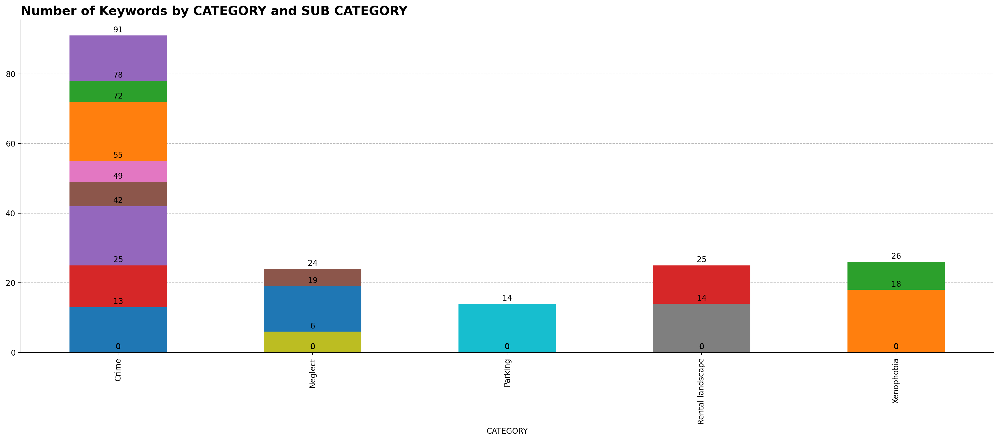

In [11]:
df_to_plot = dictionary.groupby(['CATEGORY', 'SUB CATEGORY']).KEYWORD.count().unstack('SUB CATEGORY')

fig, axes = plt.subplots(1, 1, figsize = (12, 8), dpi=200);

df_to_plot.plot.bar(stacked=True, ax=axes, zorder=2)

for container in axes.containers:
    axes.bar_label(container, padding=2, )
axes.set_title(label='Number of Keywords by CATEGORY and SUB CATEGORY', 
               loc='Left', fontsize=16, fontweight='bold')
axes.get_legend().remove()
axes.spines[['top', 'right']].set_visible(False) 
axes.grid(which='major', axis='y', linestyle='--', alpha=0.8, zorder=1)
fig.tight_layout(rect=[0, 0.00, 1.5, 1.])

**What did we find in a dictionary dataset?**
* A way to research deeper
* Quite broad categories
* Bias

***

#### What we found in datasets?

First task:    
* Texts which were gathered are distributed in an unknown manner among the geographical instances which we've been asked to consider
* Categories and sub-categories are suited, but could be broad and could intersect with each other
    * We need to understand that complexity of reality is always more complex than our schemes
    * So, we consider the given methodological frame to be 'good enough but don't waive a right to criticise it
    
Second task,
* See [Task 2. Explanatory](#Explanatory)

[To table of contents](#Table-of-Contents)

***

# Task 1

### Introduction <a class='anchor' id='Part-1-Introduction'> </a>

> **Task:** Find the main problems that are being talked about on Twitter, on a city level and on a neighbourhood level.

1. On a city level, what are the main categories of problems being expressed by residents living in the area? (size by %)
2. On a neighbourhood level, what are the sub-categories of problems being expressed by residents? (size by %)
3. Find a way to visualise this is a clear and compelling way.


> **Solution explanaition:**

* As a start point,
    * **We have** an analytics problem and two types of data - texts and their features
    * **We need** a pipeline to find if the selected text were about _problems being expressed by residents_. 
        * **Also, we need** to account _the geographical distribution of texts_. 


* So, **there is a multi-label classification problem** and **text and mixed dataset**
    *  "Text analytics" could be described in many ways
        * by the length of texts
            * Short texts - what we have
            * Long texts
        * by the domain of corpora
            * Substantive (i.e. medical - prescriptions, patient story or legal - patents, court decisions)
            * General (messages, tweets)
        * by the method of solution
            * Classical (Linguistic) approaches with some custom pre-processings
            * Frequency (Counts, TF) approaches with some custom pre-processings
            * DL (Embeddings from 2015 to 2019) approaches with some custom pre-processing
            * "Modern" DL (Transformer based models from 2019) with some built-in pre-processing
* **We will** run the most **naive baseline** - a straight search of words
    * Additionally, we pre-processed texts a bit already
    * Additionally, we will use some easy-going tokenizations (nltk.tokenize.TweetTokenizer) to plot word clouds.


* As a result,
    * **We expect** to have a fast-and-draft categorization (classification) of corpora we have
    * **We expect** to answer the task questions above

[To table of contents](#Table-of-Contents)

### Data Example <a class='anchor' id='Part-1-Data-Example'> </a>

> * social_data

In [12]:
social_data.sample(3)

,keyword,neighborhood,city,category,created_at,post_id,text,lang,translated_text
8523,Östermalm invandrare -has:links,Östermalm,Kristianstad,NaN,Wed Aug 30 17:12:47 +0000 2017,9.029422e+17,@lindbergpolemik @nya_moderaterna @carlbildt H...,sv,@lindbergpolemik @nya_moderaterna @carlbildt H...
2956,Östermalm (lägenhet OR bostadslägenhet OR våni...,Östermalm,Kristianstad,NaN,Fri Oct 23 09:28:53 +0000 2020,1.319571e+18,De flesta av oss här är privilegierade relativ...,sv,"Most of us here are relatively privileged, som..."
6040,Centrum turk -has:links,Centrum,Kristianstad,NaN,Fri Dec 09 05:58:35 +0000 2011,1.450195e+17,Metro centrum weer iets te vroeg dat word dus ...,nl,"Metro center a bit too early again, so it will..."


> * dictionary

In [13]:
dictionary.sample(2)

,CATEGORY,SUB CATEGORY,KEYWORD
171,Parking,parking,Not a single fucking parking lot
53,Crime,Fear of Safety,danger


[To table of contents](#Table-of-Contents)

### Solution code <a class='anchor' id='Part-1-Solution-code'> </a>

Let's **run the classification ("categorization") pipeline**
* We use _naive keywords search_ here

In [14]:
%time
# let's prepare regexprs string
keywords_grouped = dictionary.groupby(['CATEGORY', 'SUB CATEGORY']).KEYWORD.unique()
keyword_strings = analytical_processing._prepare_keyword_sring(keywords_grouped)

# let's run keywords search
df_aux = social_data[['keyword', 'neighborhood', 'city', 'lang', 'translated_text', 'category']]
social_data_categorized_keywords = analytical_processing.naive_keyword_search(
                                                df=df_aux, 
                                                keywords_str=keyword_strings)

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 954 ns


In [15]:
social_data_categorized_keywords.head(2)

,keyword,neighborhood,city,lang,translated_text,category,Crime_Fear of Safety_flag,Crime_battery and assault_flag,Crime_drugs_flag,Crime_gangs_flag,...,Crime_rape_flag,Crime_robbery & vandalism_flag,Neglect_housing conditions_flag,Neglect_poverty_flag,Neglect_trash_flag,Parking_parking_flag,Rental landscape_housing availability_flag,Rental landscape_rising rent_flag,Xenophobia_Islamophobia_flag,Xenophobia_Xenophobia_flag
0,Östermalm (flyktingar OR asylsökande) -has:links,Östermalm,Kristianstad,sv,@gustavkassel @AfS_riks @EmmaFeldman23 @svtnyh...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[refugees]
1,Östermalm utanförskapsområden -has:links,Östermalm,Kristianstad,sv,@federley The system we have today makes it po...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's add additional columns to see **how many problem sub categories were detected in each text**
* F.e. text with flags in `Crime_Fear of Safety` and `Crime_drugs` subcategories would have $2$ at `Crime` category in general
* Texts may (and oftenly do) have keywords from multiple categories and multiple subcategories

In [16]:
df_aux = social_data_categorized_keywords.iloc[:, :5]
df_aux = pd.concat([df_aux, ~social_data_categorized_keywords.iloc[:, 5:].isna()], axis=1)

columns = social_data_categorized_keywords.columns
for cat in dictionary.CATEGORY.unique():
    # how many crime categories were detected
    target_columns = columns[columns.str.contains(f'{cat}*')]
    df_aux[cat] = df_aux[target_columns].sum(1)
    
df_aux.head(3)

,keyword,neighborhood,city,lang,translated_text,category,Crime_Fear of Safety_flag,Crime_battery and assault_flag,Crime_drugs_flag,Crime_gangs_flag,...,Parking_parking_flag,Rental landscape_housing availability_flag,Rental landscape_rising rent_flag,Xenophobia_Islamophobia_flag,Xenophobia_Xenophobia_flag,Crime,Neglect,Rental landscape,Xenophobia,Parking
0,Östermalm (flyktingar OR asylsökande) -has:links,Östermalm,Kristianstad,sv,@gustavkassel @AfS_riks @EmmaFeldman23 @svtnyh...,False,False,False,False,False,...,False,False,False,False,True,0,0,0,1,0
1,Östermalm utanförskapsområden -has:links,Östermalm,Kristianstad,sv,@federley The system we have today makes it po...,False,False,False,False,False,...,False,False,False,False,False,0,0,0,0,0
2,Rosengård invandrare -has:links,Rosengård,Malmö,sv,@JonssonTorbjrn The need for Vi / Dem is hardl...,False,False,False,False,False,...,False,False,False,False,True,0,0,0,1,0


[To table of contents](#Table-of-Contents)

***

#### How to improve the classification model?

* From the "methodological" side
    * Work on keywords and re-work their structure
        * manually, i.e. with help of experts (add more words we looking for)
        * machinery, i.e. using packages or algorithms (add more linguistic features, word forms, change the order of words, account punctuation)
    * Process "boundary" tweets (possession into many categories)

* From the "analytical" side
    * Add more features (i.e. length of texts, num of words, num of specific words, special symbols)
    * Identify users who tweet related issues only
    * Identify users who tweet across multiple areas, pretend multiple personalities or points, use relatively aggressive languages, and narrow or straw the discussions (very active users vs 'trolls' vs influencers, agitators, bots, provocateurs, agents of interests)

* From the "technological" side
    * Compare different classification models, and dimension reduction models, work more on data


[To table of contents](#Table-of-Contents)

### Categories of Problems - general look

**After classification we see the next results**:
* About **$53.3\%$ of tweets were "categorized" using keywords search naive approach**
    * Thus, about **$46.7\%$ of tweets were not categorized at all**, either because no target category was discussed or had different keywords
* There is a **significant share of tweets with more than one category** (under naive keywords search method)
    * I.e. see `tweet 908` - `@ChytraHow is this a hopeful rhetorical question 😁 No one can voluntarily want TWO mother-in-law in one place 😶😁 please what do you specifically love about them? Junkies and homeless passports buried in bins, Arabs or gypsies? 😀` (_4 categories_)
    * About **$41.8\%$ of tweets had only one category** (see chart below)
    * About **$4.9\%$ of tweets had one or more categories (2, 3, 4)** (see chart below)
    * None had all of the categories (see chart below)
* Sometimes **tweets had more than one keyword from a same category**
    * I.e., see `tweet 1232` - `@mathieuvonrohr @Andromake000 This is how blacks in gangs behave in Sweden too! Immigrants-youth gangs-rape gangs etc! #svpol #migpol They go in hordes, burn cars like drug cartels (Somalis) Biskopsgården, Rinkeby! I HATE THEM! Rapper = #violence #booba #kaari's real assholes!` (_4 keywords_ from `Crime` category)
    * For further visualizations, we considered `Category` (& Subcategory) to be binary, not 'more' or 'less' important because of a number of keywords

**Next possible steps**:
1. To **analyze tweets with no category found** deeper, to understand what happened there
    * If there're "target" tweets with specific keywords we didn't cover still (so, need to add them)
    * If there're "non-target" tweets (i.e. casual discussions we need to send into an ordinal category)
2. To **handle tweets with multiple categories** (i.e. apply voting (weights)-based methods, add more categories, add special inter-sectional categories or subcategories)
3. To **review the quality of classification of tweets with one only category**
    * If there are false positive errors, i.e. because of words with many meanings
4. To **deep into `keyword` column deeper** (i.e. `Östermalm (flyktingar OR asylsökande) -has:links`)
5. To **use more advanced classification models** (i.e. fuzzy match, statistical, distance-based methods and embeddings, DL, pre-trained models, language models) with regard to current results (as a baseline or labeled dataset
6. To **collect more data** (from point of volume, number of observations)
    * It may allow handling contexts and meaning of words better
    * It may allow handling harder or mixed relationships better

#### Tweets with zero, one, or many categories

**Some texts had more than one keywords of category (overlapping categories), some had none (not-categorized)**. Let's see the distribution of categorization
* There is a sub-cluster of 'Crime'-related tweets on top of a dataset (could be a "leak" if we split data before)

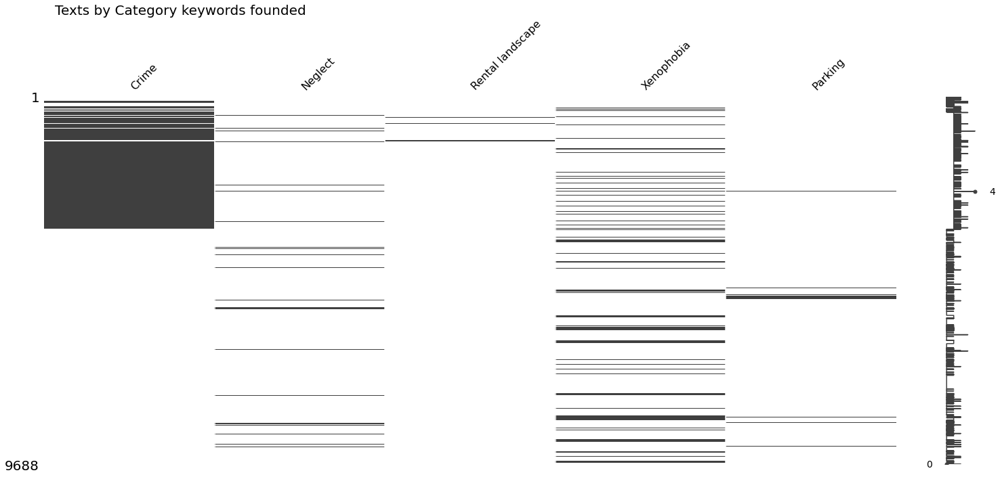

In [17]:
axes = missingno.matrix(df_aux.iloc[:, -5:].replace(0, np.nan), sparkline=True)
axes.set_title('Texts by Category keywords founded', x=0.16, fontsize=20);

#### Categorized tweets with one or many keywords

Sometimes, as said above, **texts had more than one target keyword**.
* `Crime` category prevails on this side, there were about $700$ texts with more than one keyword

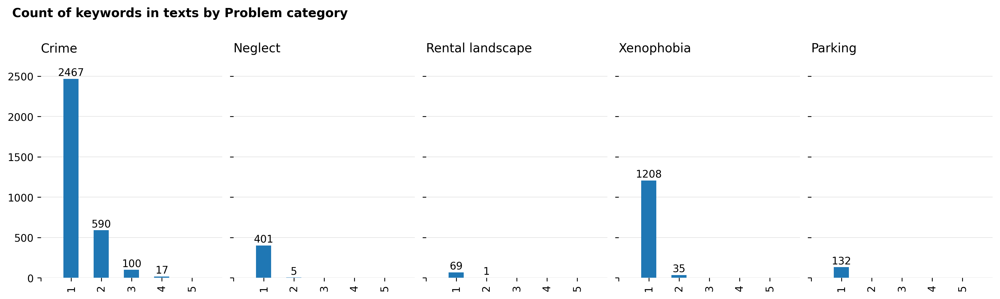

In [18]:
fig, axes = plt.subplots(1, 5, figsize=(16, 4), dpi=250, sharey=True)
for indx, category in enumerate(df_aux.columns[-5:]):
    df_aux[category].value_counts()[1:].plot.bar(ax=axes[indx], zorder=100)
    axes[indx].set_xlim(-1, 5)
    axes[indx].set_xticks(range(-1, 5), )
    axes[indx].set_xticklabels([''] + list(range(1, 6)))
    axes[indx].set_title(category, loc='left', rotation=0, y=1.05)
    axes[indx].grid(axis='y', alpha=0.4, linestyle='-', lw=0.5)
    for container in axes[indx].containers:
        axes[indx].bar_label(container, padding=1)
    axes[indx].spines[["top", "right", "left", "bottom"]].set_visible(False)
    #axes[indx].get_yaxis().set_visible(False)

fig.suptitle('Count of keywords in texts by Problem category', x=0.155, y=1.0, 
             fontweight='bold', fontsize=12)
fig.tight_layout(rect=[0, 0.00, 0.85, 1.]);

[To table of contents](#Table-of-Contents)

### Categories of Problems at City-level

#### Shares of Problems by City

So, we "categorized" our texts. Let's see what we get
* First of all, let's acquire a general look at the results
    * Plain table is the most informative way if we need the data.
    * Pie charts allow us to see **if a selected category existed in texts connected to the respective city** but harder to compare categories within one city easily
    * Another suitable option is bar charts in some creative representation


In [19]:
columns_mask = df_aux.columns[0:5].append(df_aux.columns[-5:])

df_aux_tmp = df_aux[columns_mask]
df_aux_tmp.loc[:, -5:] = df_aux_tmp.iloc[:, -5:] >= 1 # hide if need all counts not unique
df_categories_count = df_aux_tmp.groupby(['city']).sum()
df_categories_count = pd.merge(left=city_count_aux, right=df_categories_count,
                               left_on='city', right_index=True) 
df_categories_count.iloc[:, -5:] = df_categories_count.iloc[:, -5:]\
                                        .div(df_categories_count.translated_text, axis=0)

df_categories_count = df_categories_count.set_index('city')
df_categories_count

,translated_text,original_City,lat,lon,Crime,Neglect,Rental landscape,Xenophobia,Parking
city,,,,,,,,,
Borås,69,Borås,57.721084,12.940741,0.347826,0.072464,0.000000,0.086957,0.000000
Eskilstuna,921,Eskilstuna,59.371738,16.505147,0.248643,0.031488,0.001086,0.056460,0.004343
Göteborg,1398,Göteborg,57.707233,11.967017,0.358369,0.037911,0.011445,0.160229,0.002146
Haninge,67,Haninge,59.049722,18.266667,0.253731,0.029851,0.014925,0.000000,0.000000
Karlskrona,554,Karlskrona,56.162107,15.586642,0.287004,0.021661,0.000000,0.220217,0.001805
Kristianstad,4176,Kristianstad,56.029378,14.156686,0.330939,0.042385,0.007184,0.129789,0.021552
Linköping,359,Linköping,58.409813,15.624525,0.275766,0.013928,0.002786,0.128134,0.011142
Malmö,1344,Malmö,55.605293,13.000157,0.357143,0.064732,0.012649,0.107143,0.016369
Markaryd,84,Markaryd,56.459613,13.591983,0.238095,0.035714,0.000000,0.059524,0.000000


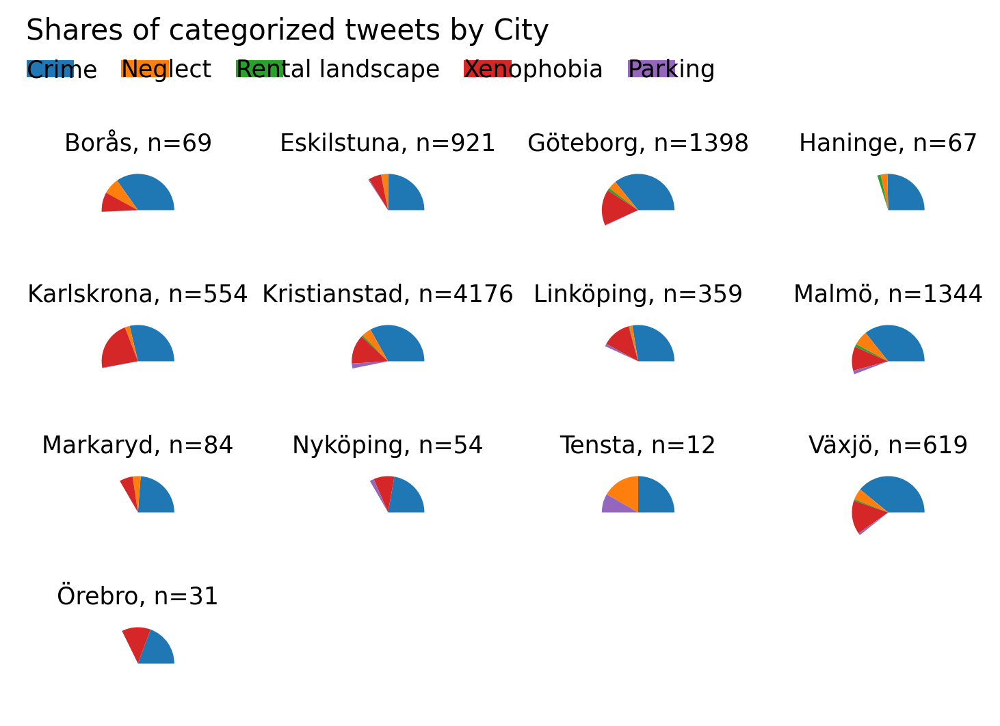

In [20]:
fig, axes = plt.subplots(4, 4, dpi=250)
axes = axes.flatten()

colors = None #['red', 'blue', 'gray', 'yellow', 'black'] # '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'

for indx, (city, row) in enumerate(df_categories_count.iterrows()):
    # print(city, row)
    axes[indx].pie(x=row[-5:], colors=colors, normalize=False) # radius=indx * 0.3
    axes[indx].set_title(city + f', n={row[0]}', size=10)
    
fig.delaxes(axes[-3]); fig.delaxes(axes[-2]); fig.delaxes(axes[-1])
    
fig.legend(df_categories_count.columns[-5:], loc='upper left', ncol=len(df_categories_count.columns[-5:]), 
           bbox_to_anchor=(0.005, 1.02), frameon=False,
           columnspacing=1., handletextpad=-2)

fig.suptitle('Shares of categorized tweets by City', x=0.28, y=1.05)

fig.tight_layout()

_Source:_ [[1]](https://towardsdatascience.com/better-annotations-with-pythons-matplotlib-46815ce098df) - legend's idea

#### Shares of Problems and Geographies of Cities - joint look

Now, let's see the **same shares at a country map**
* Remember the interactive map we had above - same but "categorized"

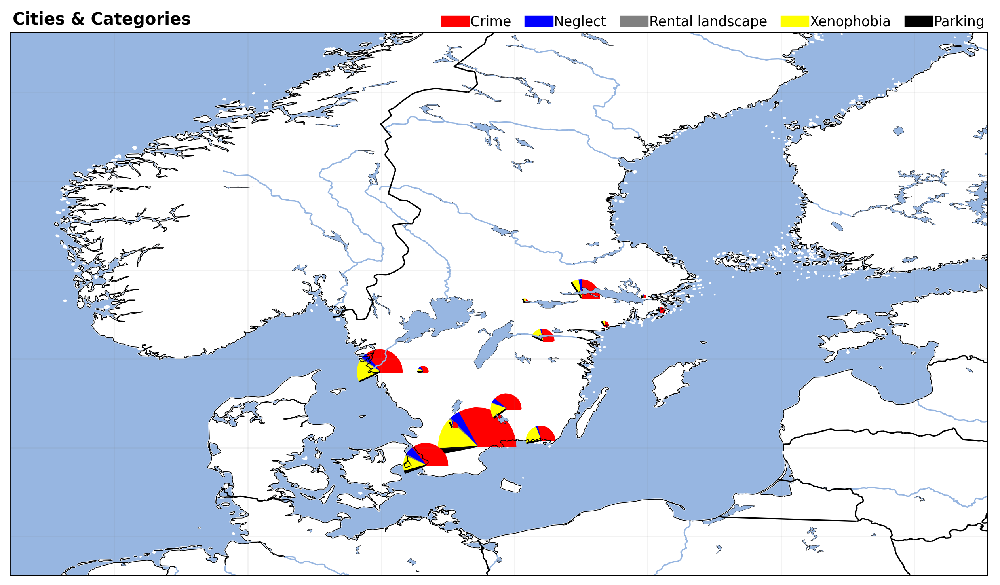

In [21]:
projection = cartopy.crs.PlateCarree()

fig, axes = plt.subplots(1, 1, figsize=(12, 8), dpi=250, 
                         subplot_kw={'projection': projection})
colors = ['red', 'blue', 'gray', 'yellow', 'black']
for indx, (city, row) in enumerate(df_categories_count.iterrows()):
    # print(city, row)
    visuals_prepared._draw_pie_marker(xs=row['lon'],
                                      ys = row['lat'],
                                      ratios=row[-5:].to_list(),
                                      sizes=row[0] * 0.75, # /2 # *0.8 
                                      colors=colors,
                                      ax=axes)

visuals_prepared._add_geo_basemap(extents=[3.6435, 25.6435, 53.1282, 65.3508],
                                  projection=projection, ax=axes)

patches_aux = zip(colors, df_categories_count.columns[-5:])
patches = [mpatches.Patch(color=patch[0], label=patch[1]) for patch in patches_aux]
axes.legend(handles = patches, loc='upper right', ncol=5, frameon=False, bbox_to_anchor=(1.01, 1.055),
           columnspacing=1., handletextpad=0.1)
#fig.legend(df_categories_count.columns[-5:], loc='upper right', 
#           ncol=5, frameon=False, bbox_to_anchor=(0.84, 0.86))
    
fig.suptitle('Cities & Categories', x=0.09, y=0.85, fontweight='bold')
fig.tight_layout(rect=[0, 0.00, 0.85, 1.]);

_Source:_ see `visuals_prepared._draw_pie_marker`

#### Shares of Problems and Geographies of Cities - separated look

We saw shares of problems in joint views. What if we try to "separate" views?

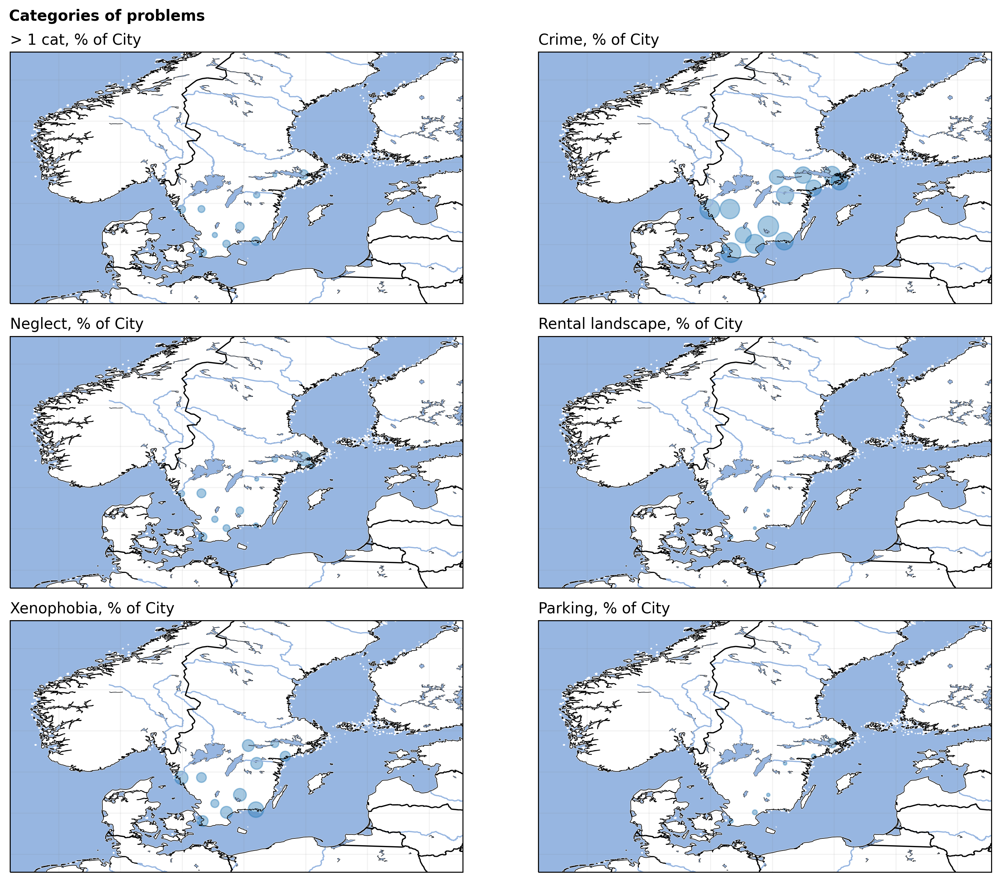

In [22]:
projection = cartopy.crs.PlateCarree()
fig, axes = plt.subplots(3, 2, figsize=(16, 10), dpi=250, 
                         subplot_kw={'projection': projection}
                        )
axes = axes.flatten()

# axes[0] -- at leas one category exist
tmp_ = df_aux_tmp.loc[df_aux_tmp.iloc[:, -5:].sum(1) > 1].city.value_counts()
df_to_plot = df_categories_count.reset_index()
df_to_plot['> 1 cat'] = city_count_aux.city.map(tmp_) / city_count_aux.translated_text

for indx, column in enumerate([df_to_plot.columns[-1]] + df_to_plot.columns[-6:-1].to_list(), 
                              start=0):
    axes[indx].scatter(x=df_to_plot['lon'], 
                       y=df_to_plot['lat'], 
                       s=df_to_plot[column] * 700,
                       alpha=0.4, #facecolors='none', edgecolor='blue'
                      )
    axes[indx].set_xticklabels(''); axes[indx].set_yticklabels('')
    axes[indx].set_title(column + ', % of City', loc='left')
    visuals_prepared._add_geo_basemap(extents=[3.6435, 25.6435, 53.1282, 65.3508],
                                  projection=projection, ax=axes[indx])
    
fig.suptitle('Categories of problems', x=0.15, fontweight='bold')
fig.tight_layout(rect=[0, 0.00, 0.85, 1.]);

del tmp_, df_to_plot;

[To table of contents](#Table-of-Contents)

### Texts and Categories of problems

We saw the distributions of problems above. 

Let's see **what vocabulary people used to explain the problems**
* Wordclouds by category

CPU times: user 7.64 s, sys: 1.36 s, total: 9 s
Wall time: 9 s


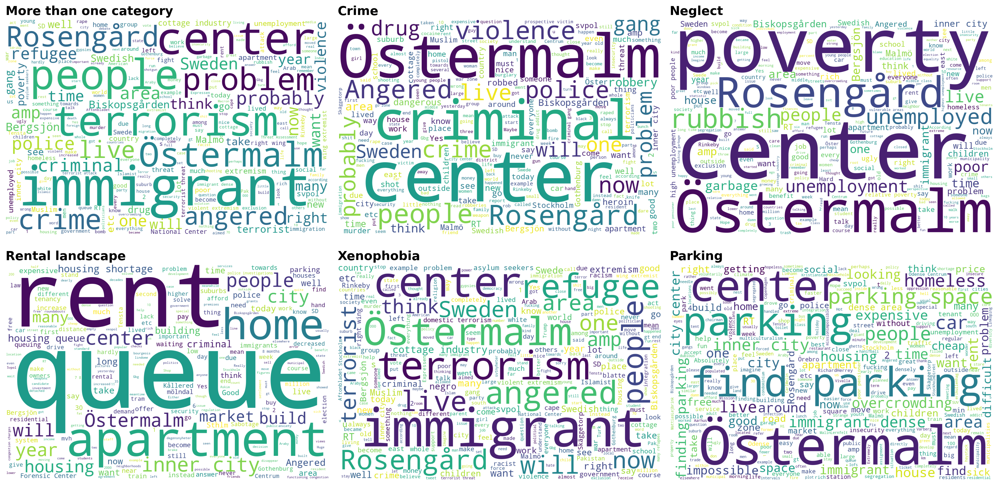

In [23]:
%%time

fig, axes = plt.subplots(2, 3, figsize=(12, 8), dpi=250);
axes = axes.flatten()

df_to_plot = df_aux_tmp[df_aux_tmp.columns[0:5].append(df_aux_tmp.columns[-5:])]

visuals_prepared.plot_wordcloud(
    df_to_plot[df_to_plot.sum(1, numeric_only=True) > 1].translated_text, 
    tokenizer = TweetTokenizer(preserve_case=False), 
    axis=axes[0])
axes[0].set_title('More than one category', loc='Left', fontweight='bold', fontsize=16)

for indx, category in enumerate(df_to_plot.columns[5:], start=1):
    visuals_prepared.plot_wordcloud(
        df_to_plot[df_to_plot[category] == 1].translated_text, 
        tokenizer = TweetTokenizer(preserve_case=False), 
        axis = axes[indx])
    axes[indx].set_title(category, loc='Left', fontweight='bold', fontsize=16)

fig.tight_layout(rect=[0, 0.00, 1.5, 1.2]);

[To table of contents](#Table-of-Contents)

### Sub-category & Neighborhoods view

It's harder to present then to get. Some ideas are:
* Use the big table
* Develop some web-app'ish like a map with many filters & interactivity
* Load shapes of neighborhoods and plot some map-like features (i.e. chloroplet with curated colors)

In [24]:
social_data_categorized_keywords.sample(3)

,keyword,neighborhood,city,lang,translated_text,category,Crime_Fear of Safety_flag,Crime_battery and assault_flag,Crime_drugs_flag,Crime_gangs_flag,...,Crime_rape_flag,Crime_robbery & vandalism_flag,Neglect_housing conditions_flag,Neglect_poverty_flag,Neglect_trash_flag,Parking_parking_flag,Rental landscape_housing availability_flag,Rental landscape_rising rent_flag,Xenophobia_Islamophobia_flag,Xenophobia_Xenophobia_flag
9549,Skäggetorp (lägenhet OR bostadslägenhet OR vån...,Skäggetorp,Linköping,sv,two months ago there was a powerful explosion ...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7287,Lindome (dyra OR dyr OR dyrt) -has:links,Lindome,Göteborg,sv,@AlltGenast Spinneriet in Lindome has incredib...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2150,Centrum (busig OR busaktig OR brottsling OR br...,Centrum,Kristianstad,sv,@David29926320 @HALLONSA The problem is basica...,NaN,NaN,NaN,NaN,NaN,...,NaN,[rob],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


[To table of contents](#Table-of-Contents)

***

# Task 2

### Introduction <a class='anchor' id='Part-2-Introduction'> </a>

> **Task:** Create a clear visualisation that shows the different types of violence that are being searched about in the past year, and what the main discourse is around each type of violence.
- Which ones have the highest search volume?
- Which ones have the highest growth in searches?

> **Solution explanaition:**

* **We have** a dataset with nested time series
* We need need to visualize this dataset in order to highlight asked points (values, trends, growth ratios).
* **We will** show 
    1. ... highest search volume
        * In both YOY and YTD representation
    2. ... highest growth in searches
        * In YOY representation
        * We define  `growth` as from $x_i$ to $x_{i-1}$

* **We could**, if there were a way to interview target clients, to ask 
    * Why we visualize it?
    * Which way they would like to see it? (chart preferences, "delivery" methods and frequency)
    * What they would like to highlight?
    * What to check or dig additionly? 
        * If there any pitfalls or disparities in data they knew?
    * Who would be the target audience of it?
        * What kind of decisions this charts use to take?

[To table of contents](#Table-of-Contents)

### Data Example <a class='anchor' id='Part-2-Data-Example'> </a>

> * search_data

|id 	| Search KWs 	| Type of violence 	| Discourse theme 	| Search Volume m/yyyy 	| Search Volume m+1/yyyy  |
|----	|---------------	|------------	|-----------------	|---------------------	| ---------------------	|
|98  	| spouse abuse  	| Physical  	| marital violence  	| 4400.0  	|... |
|115 	| wife made to have sex 	| Sexual 	| marital rape 	| NaN  	 |... |
|55 	| revenge porn 	| Psychological 	| Violence due to social rejection 	| 246000.0 |... |
|100 | domestic violence against women  	|Physical 	| marital violence 	| 2400.0 	|... |



In [25]:
search_data.sample(3)

,Search KWs,Type of violence,Discourse theme,Search Volume 5/2020,Search Volume 6/2020,Search Volume 7/2020,Search Volume 8/2020,Search Volume 9/2020,Search Volume 10/2020,Search Volume 11/2020,...,Search Volume 7/2021,Search Volume 8/2021,Search Volume 9/2021,Search Volume 10/2021,Search Volume 11/2021,Search Volume 12/2021,Search Volume 1/2022,Search Volume 2/2022,Search Volume 3/2022,Search Volume 4/2022
40,how to reject a guy nicely,Physical,Violence due to social rejection,10.0,10.0,10.0,10.0,0.0,10.0,10.0,...,10.0,10.0,10.0,10.0,0.0,10.0,0.0,10.0,10.0,10.0
168,transgender violence statistics,Physical,LGBTQ violence,170.0,590.0,260.0,210.0,210.0,260.0,480.0,...,140.0,110.0,140.0,480.0,590.0,260.0,170.0,170.0,320.0,320.0
92,family violence,Physical,marital violence,12100.0,9900.0,8100.0,9900.0,9900.0,9900.0,9900.0,...,6600.0,8100.0,8100.0,9900.0,9900.0,8100.0,8100.0,8100.0,9900.0,9900.0


**Notes:**
   * Some rows with keywords in a non-latinic script(s) (i.e. `38 | महिला अधिकार संरक्षण`)
   * Unclear meaning of `Aggregate` category
   * Some rows with NAs (missing) values

[To table of contents](#Table-of-Contents)

### Explanatory

#### Search KWs - overview

Let's observe **keywords we have**

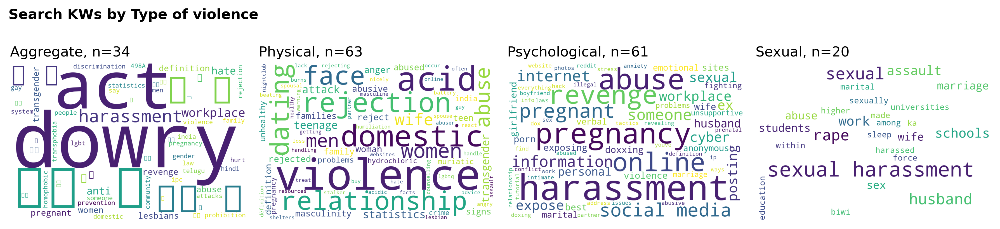

In [26]:
fig, axes = plt.subplots(1, 4, figsize=(12, 3), dpi=300);
axes = axes.flatten()

df_aux = search_data.groupby(['Type of violence'])['Search KWs '].unique()

for indx, type_violence in enumerate(df_aux.index):
    df_to_plot = pd.Series(df_aux[df_aux.index == type_violence].values[0])
    visuals_prepared.plot_wordcloud(df_to_plot,
                                    tokenizer=TweetTokenizer(preserve_case=False), 
                                    axis=axes[indx])
    title = f"{type_violence}, n={df_to_plot.shape[0]}"
    axes[indx].set_title(title, loc='left') #, fontweight='bold'
    #break

fig.suptitle('Search KWs by Type of violence', x=0.135, fontweight='bold')
fig.tight_layout()

#### Search KWs - missing values

Let's see **if any keywords had missing values** for any period(s)

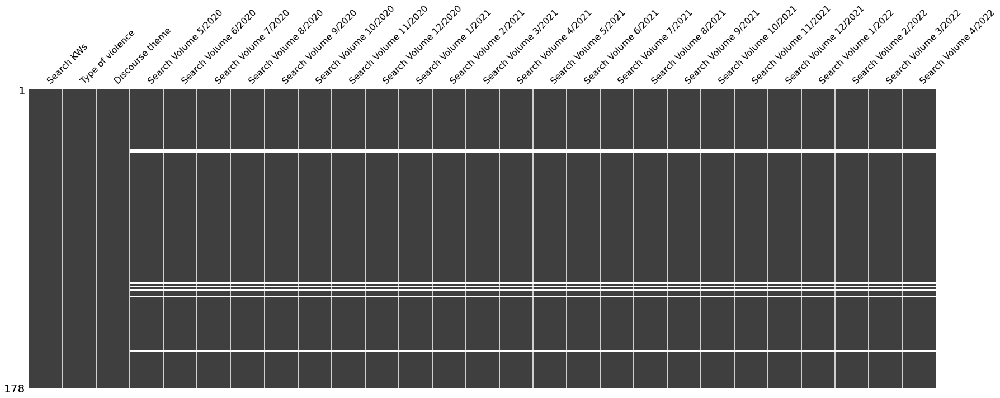

In [27]:
ax = missingno.matrix(search_data, sparkline=False)
plt.tight_layout()

[To table of contents](#Table-of-Contents)

### Solution code <a class='anchor' id='Part-2-Solution-code'> </a>

_No idea how to make it more elegant right now_

#### YOY

In [28]:
df_top_rows = pd.DataFrame(index=['1/2020', '2/2020', '3/2020', '4/2020']) # add aux rows

df_to_plot_yoy = search_data.groupby(['Type of violence']).sum().T
df_to_plot_yoy.index = df_to_plot_yoy.index.str.replace('Search Volume ', '')
df_to_plot_yoy = pd.concat([df_top_rows, df_to_plot_yoy], ignore_index=False) # add aux rows
df_to_plot_yoy['Month'] = df_to_plot_yoy.index.str.extract('(\d{1,2})/.*', expand=False)
df_to_plot_yoy['Year'] = df_to_plot_yoy.index.str.extract('.*/(\d{4})', expand=False)
df_to_plot_yoy['Total'] = df_to_plot_yoy.iloc[4:, 1:-2].sum(1)

del df_top_rows

#### YTD

In [29]:
df_to_plot_ytd = search_data.groupby(['Type of violence', 'Discourse theme']).sum().T
df_to_plot_ytd.index = df_to_plot_ytd.index.str.replace('Search Volume ', '')
df_to_plot_ytd['Month'] = df_to_plot_ytd.index.str.extract('(\d{1,2})/.*', expand=False)
df_to_plot_ytd['Year'] = df_to_plot_ytd.index.str.extract('.*/(\d{4})', expand=False)

[To table of contents](#Table-of-Contents)

### YOY view - by Type of violence

Firstly, let's **see and compare trends and values in this dataset year over year**.
* This perspective allows us to see the performance of a feature and easily compare its behavior on respective time (i.e. March 1900 and March 1901)

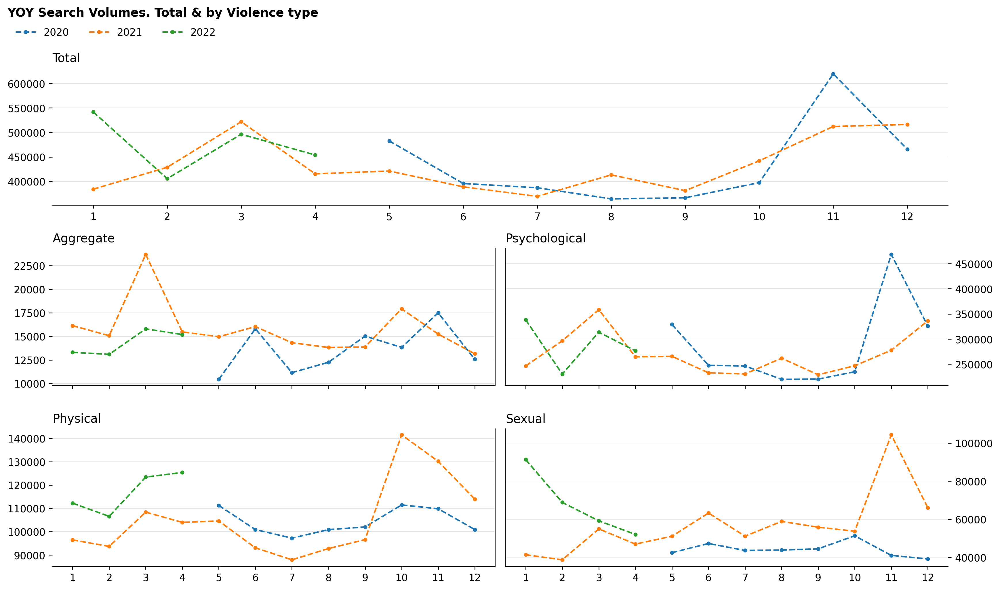

In [30]:
# prepare grid
fig = plt.figure(figsize=(14, 8), dpi=250)
gs = fig.add_gridspec(nrows=6, ncols=2)
#gs.update(vspace= -0.55)
ax0 = fig.add_subplot(gs[:2, 0:])
ax1 = fig.add_subplot(gs[2:4, 0])
ax2 = fig.add_subplot(gs[2:4, 1], sharex=ax1)
ax3 = fig.add_subplot(gs[4:, 0], sharex=ax1)
ax4 = fig.add_subplot(gs[4:, 1], sharex=ax1)
axes=[ax0, ax1, ax2, ax3, ax4]

columns = ['Total', 'Aggregate', 'Psychological', 'Physical', 'Sexual']

visuals_prepared.plot_lines_yoy(df_to_plot=df_to_plot_yoy, axes=axes, columns=columns)

# main title & legend
fig.suptitle('YOY Search Volumes. Total & by Violence type', x=0.165, y=1.02, 
             fontweight='bold', fontsize=12)
fig.legend([2020, 2021, 2022], loc='upper left', bbox_to_anchor=(0.01, 1.0), 
           frameon=False, title=None, ncol=3)
fig.tight_layout();

[To table of contents](#Table-of-Contents)

### YOY growth - by Type of violence

And **the same slice, but from a point of growth** (defined as from $x_{i+1} \text{ to } x_{i}$)

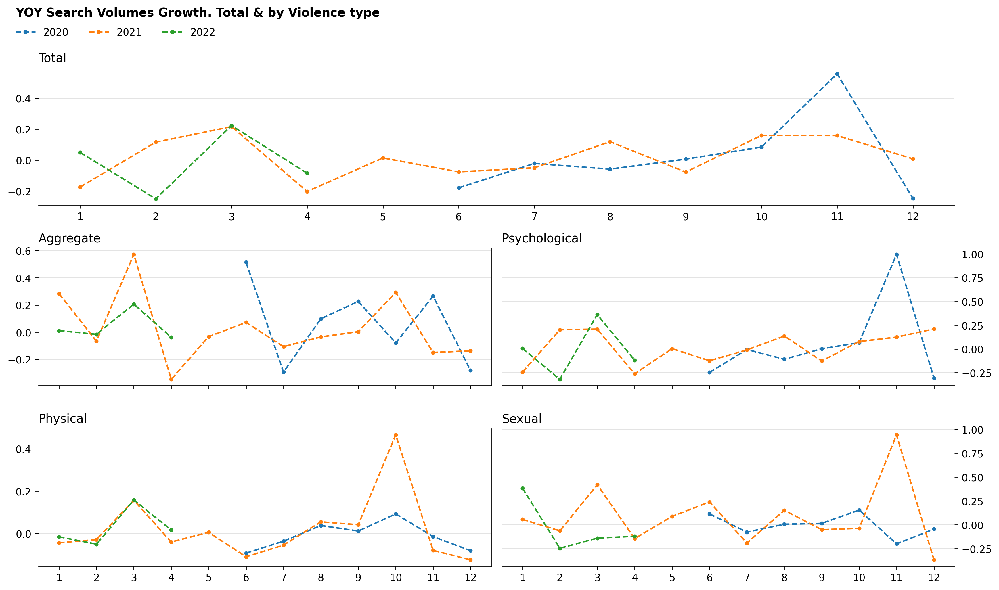

In [31]:
# prepare grid
fig = plt.figure(figsize=(14, 8), dpi=250)
gs = fig.add_gridspec(nrows=6, ncols=2)
#gs.update(vspace= -0.55)
ax0 = fig.add_subplot(gs[:2, 0:])
ax1 = fig.add_subplot(gs[2:4, 0])
ax2 = fig.add_subplot(gs[2:4, 1], sharex=ax1)
ax3 = fig.add_subplot(gs[4:, 0], sharex=ax1)
ax4 = fig.add_subplot(gs[4:, 1], sharex=ax1)
axes=[ax0, ax1, ax2, ax3, ax4]

columns = ['Total', 'Aggregate', 'Psychological', 'Physical', 'Sexual']
df_to_plot_growth = pd.concat([df_to_plot_yoy[df_to_plot_yoy.columns[0:4].to_list() + ['Total']].pct_change(1), 
                        df_to_plot_yoy[['Month', 'Year']]], axis=1)
visuals_prepared.plot_lines_yoy(df_to_plot=df_to_plot_growth, axes=axes, columns=columns)

# main title & legend
fig.suptitle('YOY Search Volumes Growth. Total & by Violence type', x=0.2, y=1.02, 
             fontweight='bold', fontsize=12)
fig.legend([2020, 2021, 2022], loc='upper left', bbox_to_anchor=(0.01, 1.0), 
           frameon=False, title=None, ncol=3)
fig.tight_layout();

[To table of contents](#Table-of-Contents)

### YTD view - by Type of violence & Discourse theme

Next, let's **see trends and values in search volumes dataset year to last date present** in a dataset.
* This perspective allows us to easily observe a more general picture of performance and behavior from latest to the most recent observation

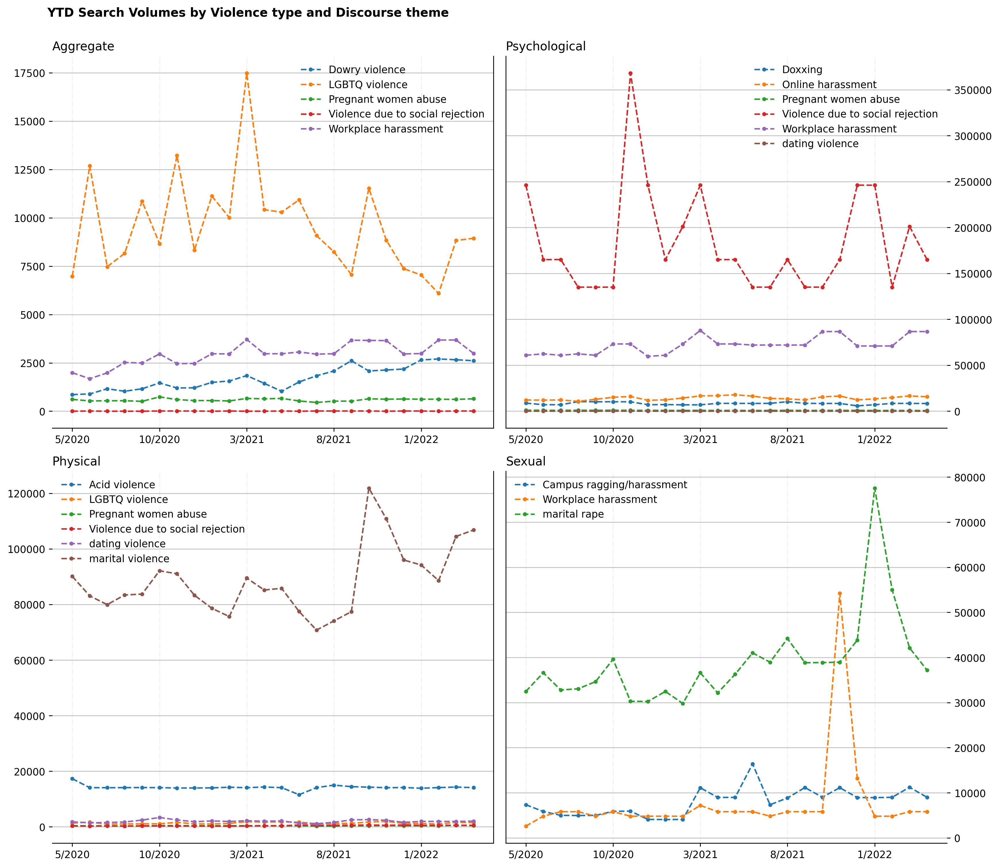

In [32]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12), dpi=250, 
                         sharey=False, sharex=False);
axes = axes.flatten()

for indx, type_violence in enumerate(columns[1:]):
    df_to_plot_ytd[type_violence].plot.line(ax=axes[indx], style='--', marker='.')
    #np.log(df_to_plot).plot.line(figsize=(12, 8), ax=axes[indx]) # np.log1p
    axes[indx].grid(axis='y', alpha=0.5, linestyle='-', color='gray')
    axes[indx].grid(axis='x', alpha=0.2, linestyle='-.')
    axes[indx].set_title(type_violence, loc='left')
    axes[indx].legend(frameon=False) # ncol=2
    if (indx + 1) % 2 == 0:
        axes[indx].yaxis.tick_right()
        axes[indx].spines[["top", "right"]].set_visible(False)
    else:
        axes[indx].spines[["top", "left"]].set_visible(False)

# main title & legend
fig.suptitle('YTD Search Volumes by Violence type and Discourse theme', x=0.25, y=1.0, 
             fontweight='bold', fontsize=12)
fig.tight_layout();

[To table of contents](#Table-of-Contents)

***

#### How to improve the charts above?
1. Technological approaches (more engineering)
    * Make it interactive
    * Use bigger (in size) and more (in quantity) monitors
    * Make it auto-updating (i.e. schedulers, streaming)
    * Use specialized BI software (i.e. PowerBI, Looker, Tableau, Redash)
    * Use specialized packages for web-native'er visualization apps (i.e. JS, Shiny, Dash, Streamlit)
2. Substantive approaches (more analytical)
    * Communicate to acquire more info on why we need it and what we need to highlight (show)

[To table of contents](#Table-of-Contents)